# Notebook: NANSNet version 1

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import progressbar
from csv import writer
import numpy as np
import random
import tensorflow as tf

import pickle
from pickle import dump

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, Input, LSTM,LeakyReLU
from tensorflow.keras.layers import Embedding, Concatenate,Conv2D,MaxPooling2D,Multiply,Conv1D
from tensorflow.keras.layers import GlobalMaxPooling2D,BatchNormalization,Conv1D,MaxPooling1D,GlobalMaxPooling1D,GlobalMaxPooling1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model,Sequential,load_model
import tensorflow.keras
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow.keras.backend as K
from tensorflow.keras.mixed_precision import experimental as mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_policy(policy)
#tf.executing_eagerly()

import cv2
import matplotlib.pyplot as plt


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: GeForce RTX 2080 Ti, compute capability 7.5
Instructions for updating:
Use tf.keras.mixed_precision.LossScaleOptimizer instead. LossScaleOptimizer now has all the functionality of DynamicLossScale


In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
num_classes=1000


# Load prepared data

In [4]:
data=pd.read_csv("answersOneHot"+str(num_classes)+".csv")

In [5]:
file= open("questions"+str(num_classes)+".pickle","rb")
questions=pickle.load(file)
questions=questions[:len(data)]
file.close()

In [6]:
file= open("imageIds"+str(num_classes)+".pickle","rb")
imIds=pickle.load(file)
imIds=imIds[:len(data)]
file.close()


# Check if everything was loaded propperly

In [7]:
print(len(imIds),"imIds")
print(imIds.head(5))
print(len(questions),"questions")
print(questions.head(5))
print(len(data),"data")
print(data.head(5))

578452 imIds
   imgIds
0  458752
1  458752
2  458752
3  458752
4  262146
578452 questions
   0  1  2  3  4  5  6  7  8  9  ...  13  14  15  16  17   18  19   20   21  \
0  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   3   2    5  27   76  102   
1  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   0   3  595   2    5   15   
2  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   0   3   12   2    1  322   
3  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   2   5   15   8  392  356   
4  0  0  0  0  0  0  0  0  0  0  ...   0   0   0   0   0    3  12    2    1   

    22  
0  451  
1   60  
2   53  
3  208  
4  196  

[5 rows x 23 columns]
578452 data
   0  1  2  3  4  5  6  7  8  9  ...  990  991  992  993  994  995  996  997  \
0  0  0  0  0  0  0  0  0  0  0  ...    0    0    0    0    0    0    0    0   
1  0  0  0  0  0  0  0  0  0  0  ...    0    0    0    0    0    0    0    0   
2  0  0  0  0  0  0  0  0  0  0  ...    0    0    0    0    0    0    0    0   
3  0  0  1  0  0  0  0  0 

In [8]:
relation=389975 # train/validation split

imIdsTrain=imIds.loc[:relation-1]
imIdsTrain=imIdsTrain.reset_index().drop(["index"],axis=1)
print(len(imIdsTrain),"imIdsTrain")

questionsTrain=questions.loc[:relation-1]
questionsTrain=questionsTrain.reset_index().drop(["index"],axis=1)
print(len(questionsTrain),"questionsTrain")

dataTrain=data.loc[:relation-1]
dataTrain=dataTrain.reset_index().drop(["index"],axis=1)
print(len(dataTrain),"dataTrain")

imIdsVal=imIds.loc[relation:]
imIdsVal=imIdsVal.reset_index().drop(["index"],axis=1)
print(len(imIdsVal),"imIdsVal")

questionsVal=questions.loc[relation:]
questionsVal=questionsVal.reset_index().drop(["index"],axis=1)
print(len(questionsVal),"questionsVal")

dataVal=data.loc[relation:]
dataVal=dataVal.reset_index().drop(["index"],axis=1)
print(len(dataVal),"dataVal")

389975 imIdsTrain
389975 questionsTrain
389975 dataTrain
188477 imIdsVal
188477 questionsVal
188477 dataVal


In [9]:
imIdsTrain.head()
print(imIdsTrain.loc[389974])

imgIds    524286
Name: 389974, dtype: int64


## Load tokenizers

In [10]:
file= open("tokenizer"+str(num_classes)+".pickle","rb")
tokenizer=pickle.load(file)
file.close()

In [11]:
file= open("tokenizer_onehot"+str(num_classes)+".pickle","rb")
print("tokenizer_onehot"+str(num_classes)+".pickle")
tokenizer_onehot=pickle.load(file)
file.close()

tokenizer_onehot1000.pickle


## This part is used for checking if answers, questions and pictures are suited to each other
## Lets test, if everething was loaded correctly,


In [12]:
num =0#409401
perfix="../VQA/validationSet/val2014/COCO_val2014_000000"
#perfix="/home/anton/Uni/MLB/Projekt/VQA/trainSet/train2014/COCO_train2014_000000"
#perfix="/data/home/tom/Uni/MLB/data/VQA/trainSet/train2014/COCO_train2014_000000"
#perfix="/data/home/tom/Uni/MLB/data/VQA/validationSet/val2014/COCO_val2014_000000"

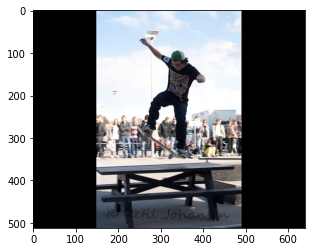

In [13]:
img = cv2.imread(perfix+str(np.asarray(imIdsVal)[num,0]).zfill(6)+".jpg")
#img = cv2.imread(perfix+str(np.asarray(imIdsTrain)[num,0]).zfill(6)+".jpg")
#print(perfix+str(np.asarray(imIdsTrain)[num,0]).zfill(6)+".jpg")
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
plt.imshow(img)

In [14]:
print("question:",tokenizer.sequences_to_texts([np.asarray(questionsVal)[num]]))
#print("question:",tokenizer.sequences_to_texts([np.asarray(questionsTrain)[num]]))

question: ['where is he looking']


In [15]:
print("answer:",tokenizer_onehot.sequences_to_texts([[int(np.argmax(np.asarray(dataVal)[num]))]]))
#print("answer:",tokenizer_onehot.sequences_to_texts([[int(np.argmax(np.asarray(dataTrain)[num]))]]))

answer: ['down']


# Parameters

In [16]:
network_size=(331,331)
batch_size=128
#intType="uint16"
floatType="float32"
tfType=tf.float32

# Create Data Generator

#### https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly

In [17]:
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs,questions, answers, batch_size=256, dim=(224,224), n_channels=3,
                 n_classes=1000, shuffle=True,name="train"):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.questions=questions
        self.answers = answers
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()
        if name=="train":
            self.perfix="../VQA/trainSet/train2014/COCO_train2014_000000"
            print("train",self.perfix)
        if name=="validation":
            self.perfix="../VQA/validationSet/val2014/COCO_val2014_000000"
            print("validation",self.perfix)

        self.name=name
        print(len(self.list_IDs),"self.list_IDs")
        print(len(self.questions),"self.questions")
        print(len(self.answers),"self.answers")
        print("self.questions.dtype: ",self.questions.dtype )
        print("self.answers.dtype: ",self.answers.dtype,"\n" )

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        #print(index)
        # Find list of IDs
        list_IDs_temp=[]
        list_answs_temp=[]
        list_quests_temp=[]
        for k in indexes:
            list_IDs_temp.append(self.list_IDs[k][0]) 
            list_answs_temp.append(self.answers[k])
            list_quests_temp.append(self.questions[k])

        # Generate data
        X, y = self.__data_generation(list_IDs_temp,list_answs_temp,list_quests_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        self.counter=0
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp,list_answs_temp,list_quests_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        embX = np.empty((self.batch_size, 23))
        y = np.empty((self.batch_size,num_classes))
        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            
            
            img = cv2.imread(self.perfix+str(ID).zfill(6)+".jpg")
            img = cv2.resize(img, network_size) 
            
            #img = load_img(perfix+str(imIdsVal.loc[num][0]).zfill(6)+".jpg", target_size=network_size)
            #img = img_to_array(img)
            
         

            X[i,] = tf.keras.applications.nasnet.preprocess_input(img)            
            embX[i]=list_quests_temp[i]
            y[i] = list_answs_temp[i]
            self.counter+=1
        return [X,embX], y

# Training

## Pretrain language model only. It is also interesting to see a base line. What could be done only with text.

In [18]:
dropout=.2
question_input = Input(shape=(23,))
encoded_question = Embedding(input_dim=18702, output_dim=50, input_length=23)(question_input)
encoded_question = LSTM(256, return_sequences=True)(encoded_question)
encoded_question=LeakyReLU()(encoded_question)

encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Flatten()(encoded_question)

encoded_question = Dense(7744)(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)

In [19]:

merged = Dense(num_classes, activation='softmax',dtype="float32")(encoded_question)

text_only_model = Model(inputs=question_input, outputs=merged)



Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 23)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 23, 50)            935100    
_________________________________________________________________
lstm (LSTM)                  (None, 23, 256)           314368    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 23, 256)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 23, 128)           98432     
_________________________________________________________________
batch_normalization (BatchNo (None, 23, 128)           512       
_________________________________________________________________
activation (Activation)      (None, 23, 128)           0     

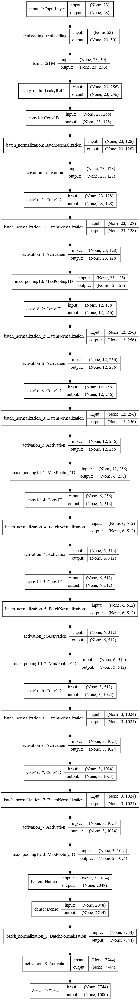

In [20]:
mcp_save = ModelCheckpoint("NASNet/NASNet_text_only.h5", monitor='val_loss', mode='min', verbose=2,save_best_only=True)
text_only_model.summary()
plot_model(text_only_model,show_shapes=True, to_file="NASNet/NASNet_text_only_"+str(num_classes)+".png")

In [21]:
reduce_lr= ReduceLROnPlateau(monitor='val_loss',factor=np.sqrt(0.1),patience=5, min_lr=0.5e-6)
recall=tf.keras.metrics.Recall()
precision=tf.keras.metrics.Precision()
auc=tf.keras.metrics.AUC()

optimizer=tf.keras.optimizers.SGD()#(lr=0.0005, rho=0.9, epsilon=None, decay=0.0)
text_only_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=["categorical_crossentropy",'accuracy',recall,precision]) #rmsprop -

  opt = tf.keras.mixed_precision.experimental.LossScaleOptimizer(opt)



In [202]:
history=text_only_model.fit(np.asarray(questionsTrain),np.asarray(dataTrain), validation_data=(np.asarray(questionsVal),np.asarray(dataVal)),callbacks=[mcp_save,reduce_lr],epochs=75,batch_size=2048)

Epoch 1/75
191/191 [==============================] - 19s 90ms/step - loss: 4.3593 - categorical_crossentropy: 4.3593 - accuracy: 0.2276 - recall_9: 0.1692 - precision_9: 0.4410 - val_loss: 5.4627 - val_categorical_crossentropy: 5.4627 - val_accuracy: 0.2181 - val_recall_9: 0.0000e+00 - val_precision_9: 0.0000e+00

Epoch 00001: val_loss improved from inf to 5.46265, saving model to tempSaves/mobilenet/mobilenet.h5
Epoch 2/75
191/191 [==============================] - 16s 85ms/step - loss: 2.8862 - categorical_crossentropy: 2.8862 - accuracy: 0.2922 - recall_9: 0.2150 - precision_9: 0.4855 - val_loss: 4.9806 - val_categorical_crossentropy: 4.9806 - val_accuracy: 0.2109 - val_recall_9: 0.0000e+00 - val_precision_9: 0.0000e+00

Epoch 00002: val_loss improved from 5.46265 to 4.98062, saving model to tempSaves/mobilenet/mobilenet.h5
Epoch 3/75
191/191 [==============================] - 16s 85ms/step - loss: 2.6568 - categorical_crossentropy: 2.6568 - accuracy: 0.3102 - recall_9: 0.2149 - pr


Epoch 00022: val_loss did not improve from 3.08503
Epoch 23/75
191/191 [==============================] - 16s 84ms/step - loss: 3.1835 - categorical_crossentropy: 3.1835 - accuracy: 0.3512 - recall_9: 0.2195 - precision_9: 0.5351 - val_loss: 3.4790 - val_categorical_crossentropy: 3.4790 - val_accuracy: 0.3405 - val_recall_9: 0.2046 - val_precision_9: 0.5246

Epoch 00023: val_loss did not improve from 3.08503
Epoch 24/75
191/191 [==============================] - 16s 83ms/step - loss: 3.1720 - categorical_crossentropy: 3.1720 - accuracy: 0.3507 - recall_9: 0.2185 - precision_9: 0.5332 - val_loss: 3.5606 - val_categorical_crossentropy: 3.5606 - val_accuracy: 0.3396 - val_recall_9: 0.2205 - val_precision_9: 0.5236

Epoch 00024: val_loss did not improve from 3.08503
Epoch 25/75
191/191 [==============================] - 16s 83ms/step - loss: 3.1770 - categorical_crossentropy: 3.1770 - accuracy: 0.3490 - recall_9: 0.2168 - precision_9: 0.5325 - val_loss: 3.4759 - val_categorical_crossentro

KeyboardInterrupt: 

## if you have any models which training process was interrupted, you can load it here

In [22]:

#del text_only_model
#text_only_model=load_model("NASNet/NASNet_text_only.h5")
vqa_model=load_model("NASNet/NASNet_vision_blocked.h5")

# Adding Vision Model

### Creating text model and load weights from text_only_model

In [34]:
question_input = Input(shape=(23,))
encoded_question = Embedding(input_dim=18702, output_dim=50, input_length=23)(question_input)
encoded_question = LSTM(256, return_sequences=True)(encoded_question)
encoded_question=LeakyReLU()(encoded_question)

encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(64*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)

encoded_question=Conv1D(128*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(256*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)

encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question=Conv1D(512*2,3,padding="same")(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)
encoded_question = MaxPooling1D(pool_size=(2), strides=(2), padding='same')(encoded_question)


encoded_question=Flatten()(encoded_question)


encoded_question = Dense(7744)(encoded_question)
encoded_question = BatchNormalization()(encoded_question)
encoded_question = Activation("relu")(encoded_question)

text_model = Model(inputs=question_input, outputs=encoded_question)

text_model_layers=[]

### set weights from pretrained text model
#for i in range(len(text_model.layers)):
#    text_model.layers[i].set_weights(text_only_model.layers[i].get_weights())

## NASNet Vision Model

In [35]:
image_input=Input(shape=(network_size[0],network_size[1],3))
base_model=tf.keras.applications.NASNetLarge(input_shape=(network_size[0], network_size[1], 3), include_top=False, pooling="None",weights='imagenet', input_tensor=image_input)
base_model = Model(inputs=[base_model.input], outputs=base_model.output)
print("base_model.layers len: ",len(base_model.layers))
for i,layer in enumerate(base_model.layers):
    #if i<240:
    layer.trainable = False
image_model=base_model.output
image_model= Conv2D(64,kernel_size=(1,1),strides=(1,1),activation="relu",padding="same")(image_model)

base_model_layers=[]
for layer in base_model.layers:
    base_model_layers.append(layer.name)

base_model.layers len:  1039


In [36]:
image_model=Flatten()(image_model)

base_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 331, 331, 3) 0                                            
__________________________________________________________________________________________________
stem_conv1 (Conv2D)             (None, 165, 165, 96) 2592        input_5[0][0]                    
__________________________________________________________________________________________________
stem_bn1 (BatchNormalization)   (None, 165, 165, 96) 384         stem_conv1[0][0]                 
__________________________________________________________________________________________________
activation_36 (Activation)      (None, 165, 165, 96) 0           stem_bn1[0][0]                   
____________________________________________________________________________________________

Total params: 84,916,818
Trainable params: 0
Non-trainable params: 84,916,818
__________________________________________________________________________________________________


### concatenate models

In [37]:
# Combine Vision_model and text_model to create the final model

merged=Multiply()([image_model,text_model.output])

merged=Dense(4024)(merged)
merged=BatchNormalization()(merged)
merged=LeakyReLU()(merged)


merged=Dense(1000, activation='softmax')(merged)

vqa_model = Model(inputs=[base_model.input,question_input], outputs=merged)



In [38]:

plot_model(vqa_model,show_shapes=True, to_file="NASNet/NASNet_text_and_vision.png")

In [39]:
vqa_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 331, 331, 3) 0                                            
__________________________________________________________________________________________________
stem_conv1 (Conv2D)             (None, 165, 165, 96) 2592        input_5[0][0]                    
__________________________________________________________________________________________________
stem_bn1 (BatchNormalization)   (None, 165, 165, 96) 384         stem_conv1[0][0]                 
__________________________________________________________________________________________________
activation_36 (Activation)      (None, 165, 165, 96) 0           stem_bn1[0][0]                   
____________________________________________________________________________________________

Total params: 143,889,614
Trainable params: 58,941,580
Non-trainable params: 84,948,034
__________________________________________________________________________________________________


In [40]:
for i,layer in enumerate(vqa_model.layers):
    print(" layer.name = ",layer.name, layer.trainable)

 layer.name =  input_5 False
 layer.name =  stem_conv1 False
 layer.name =  stem_bn1 False
 layer.name =  activation_36 False
 layer.name =  reduction_conv_1_stem_1 False
 layer.name =  reduction_bn_1_stem_1 False
 layer.name =  activation_37 False
 layer.name =  activation_39 False
 layer.name =  separable_conv_1_pad_reduction_left1_stem_1 False
 layer.name =  separable_conv_1_pad_reduction_right1_stem_1 False
 layer.name =  separable_conv_1_reduction_left1_stem_1 False
 layer.name =  separable_conv_1_reduction_right1_stem_1 False
 layer.name =  separable_conv_1_bn_reduction_left1_stem_1 False
 layer.name =  separable_conv_1_bn_reduction_right1_stem_1 False
 layer.name =  activation_38 False
 layer.name =  activation_40 False
 layer.name =  separable_conv_2_reduction_left1_stem_1 False
 layer.name =  separable_conv_2_reduction_right1_stem_1 False
 layer.name =  activation_41 False
 layer.name =  separable_conv_2_bn_reduction_left1_stem_1 False
 layer.name =  separable_conv_2_bn_reduct

In [23]:
del text_only_model  #free place

## Validate on 1/3 of the data

In [24]:
size_value=331
network_size=(size_value,size_value)#(224,224)
batch_size=128

paramsT = {'dim': network_size,
          'batch_size': batch_size,
          'n_classes': num_classes,
          'n_channels': 3,
          'shuffle': True,
            "name":"train"
          }

paramsV = {'dim': network_size,
          'batch_size': batch_size,
          'n_classes': num_classes,
          'n_channels': 3,
          'shuffle': True,
           "name":"validation"
          }

training_generator = DataGenerator(np.asarray(imIdsTrain)[:150000], np.asarray(questionsTrain)[:150000],np.asarray(dataTrain)[:150000], **paramsT)
validation_generator = DataGenerator(np.asarray(imIdsVal)[:100000], np.asarray(questionsVal)[:100000],np.asarray(dataVal)[:100000], **paramsV)
training_generator_full = DataGenerator(np.asarray(imIdsTrain), np.asarray(questionsTrain),np.asarray(dataTrain), **paramsT)
validation_generator_full = DataGenerator(np.asarray(imIdsVal), np.asarray(questionsVal),np.asarray(dataVal), **paramsV)

train ../VQA/trainSet/train2014/COCO_train2014_000000
150000 self.list_IDs
150000 self.questions
150000 self.answers
self.questions.dtype:  int64
self.answers.dtype:  int64 

validation ../VQA/validationSet/val2014/COCO_val2014_000000
100000 self.list_IDs
100000 self.questions
100000 self.answers
self.questions.dtype:  int64
self.answers.dtype:  int64 

train ../VQA/trainSet/train2014/COCO_train2014_000000
389975 self.list_IDs
389975 self.questions
389975 self.answers
self.questions.dtype:  int64
self.answers.dtype:  int64 

validation ../VQA/validationSet/val2014/COCO_val2014_000000
188477 self.list_IDs
188477 self.questions
188477 self.answers
self.questions.dtype:  int64
self.answers.dtype:  int64 



In [25]:
reduce_lr= ReduceLROnPlateau(monitor='val_loss',factor=np.sqrt(0.1),patience=6, min_lr=0.5e-6)
recall=tf.keras.metrics.Recall()
precision=tf.keras.metrics.Precision()
auc=tf.keras.metrics.AUC()

## Training will take couple of nights, untill some resoults could be observed

In [26]:
mcp_save = ModelCheckpoint('NASNet/NASNnet_vision_blocked.h5', monitor='val_loss', mode='min', verbose=2,save_best_only=True)
optimizer=tf.keras.optimizers.SGD(lr=0.001) # if you restart the training of already trained model, change lr to 0.001, 0.0001 a s.o.
vqa_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy',recall,precision])


  opt = tf.keras.mixed_precision.experimental.LossScaleOptimizer(opt)



In [ ]:
history=vqa_model.fit_generator(generator=training_generator_full,
                    validation_data=validation_generator,
                    use_multiprocessing=False,
                    workers=60,callbacks=[mcp_save,reduce_lr],epochs=100)

Epoch 1/100
3046/3046 [==============================] - 2692s 879ms/step - loss: 7.7360 - accuracy: 0.4087 - recall_1: 0.2482 - precision_1: 0.5755 - val_loss: 17.1294 - val_accuracy: 0.3699 - val_recall_1: 0.2248 - val_precision_1: 0.5419

Epoch 00001: val_loss improved from inf to 17.12939, saving model to NASNet/NASNnet_vision_blocked.h5
Epoch 2/100
3046/3046 [==============================] - 2635s 865ms/step - loss: 7.1370 - accuracy: 0.4125 - recall_1: 0.2495 - precision_1: 0.5803 - val_loss: 17.3973 - val_accuracy: 0.3757 - val_recall_1: 0.2302 - val_precision_1: 0.5476

Epoch 00002: val_loss did not improve from 17.12939
Epoch 3/100
  58/3046 [..............................] - ETA: 34:21 - loss: 10.8774 - accuracy: 0.4269 - recall_1: 0.2331 - precision_1: 0.5816

In [311]:
vqa_model.save("NASNet/NASNet_vision_blocked_last.h5")

In [307]:
optimizer=tf.keras.optimizers.Adadelta()
vqa_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy',recall,precision])#,eager_mode=False)


  opt = tf.keras.mixed_precision.experimental.LossScaleOptimizer(opt)



In [310]:
history=vqa_model.fit_generator(generator=training_generator_full,
                    validation_data=validation_generator,
                    use_multiprocessing=False,
                    workers=60,callbacks=[mcp_save],epochs=100)

Epoch 1/100
1523/1523 [==============================] - 2652s 2s/step - loss: 7.9387 - accuracy: 0.4075 - recall_9: 0.2461 - precision_9: 0.5787 - val_loss: 14.1017 - val_accuracy: 0.3731 - val_recall_9: 0.2253 - val_precision_9: 0.5452

Epoch 00001: val_loss did not improve from 3.73412
Epoch 2/100
1523/1523 [==============================] - 2631s 2s/step - loss: 7.7077 - accuracy: 0.4083 - recall_9: 0.2460 - precision_9: 0.5799 - val_loss: 14.5995 - val_accuracy: 0.3735 - val_recall_9: 0.2268 - val_precision_9: 0.5456

Epoch 00002: val_loss did not improve from 3.73412
Epoch 3/100
1523/1523 [==============================] - 2625s 2s/step - loss: 7.8619 - accuracy: 0.4092 - recall_9: 0.2463 - precision_9: 0.5806 - val_loss: 13.7131 - val_accuracy: 0.3732 - val_recall_9: 0.2276 - val_precision_9: 0.5445

Epoch 00003: val_loss did not improve from 3.73412
Epoch 4/100
1523/1523 [==============================] - 2634s 2s/step - loss: 8.0435 - accuracy: 0.4088 - recall_9: 0.2463 - prec

KeyboardInterrupt: 

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Let's run trained network.
### Network, tokenizers and data could be loaded with cells in the beginning.

### Load model if needed

In [44]:
num_classes=1000
vqa_model=load_model("NASNet/NASNet_vision_blocked.h5")

### Load images

In [173]:
#num_=114000
#num_=12750
num_=121355
#network_size=(331,331)

In [174]:
#perfix="../VQA/testSet/test2015/COCO_test2015_000000"
perfix="../VQA/validationSet/val2014/COCO_val2014_000000"

img = cv2.imread(perfix+str(imIdsVal.loc[num_][0]).zfill(6)+".jpg")
img = cv2.resize(img, network_size)
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

#img = load_img(perfix+str(imIdsVal.loc[num_][0]).zfill(6)+".jpg", target_size=network_size)
#img = img_to_array(img)
X = np.empty((1, *network_size, 3))
X[0,]=np.asfarray( tf.keras.applications.mobilenet_v2.preprocess_input(img))

## Input question

In [175]:
#qwes="Are there any people?"
#qwes="Are there any flowers?"
#qwes="What kind of animals are there?"
qwes="What is on the picture?"
#qwes="What does man hold in the hand?"
#qwes="What season is on the picture?"
qwesNp = np.empty((1, 23))
question = pad_sequences(tokenizer.texts_to_sequences([qwes]), maxlen=23)
qwesNp=np.asarray(question)

In [176]:
qwesNp

array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  3,  2,  7,  1, 17]], dtype=int32)

## Run Model

In [177]:
output=vqa_model.predict([X,qwesNp])

### Select 5 most possible answers

In [178]:
tempList=output.copy()[0]
tempList.sort()

In [179]:
answ1=tokenizer_onehot.sequences_to_texts([[np.argmax(output)]])
answ2=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-2])]])
answ3=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-3])]])
answ4=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-4])]])
answ5=tokenizer_onehot.sequences_to_texts([[output.tolist()[0].index(tempList[-5])]])

['bear'] 0.1692
['teddy_bear'] 0.1186
['dog'] 0.08575
['cat'] 0.05917
['nothing'] 0.02327


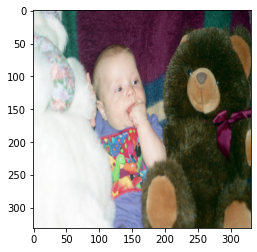

In [180]:
plt.imshow(img)
print(answ1,output[0,output.tolist()[0].index(tempList[-1])])
print(answ2,output[0,output.tolist()[0].index(tempList[-2])])
print(answ3,output[0,output.tolist()[0].index(tempList[-3])])
print(answ4,output[0,output.tolist()[0].index(tempList[-4])])
print(answ5,output[0,output.tolist()[0].index(tempList[-5])])